# Face Generation
In this project, you'll use generative adversarial networks(GANs) to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- [MNIST](http://yann.lecun.com/exdb/mnist/)
- [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'

import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

You are using pip version 9.0.1, however version 18.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

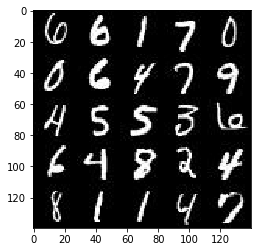

In [2]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

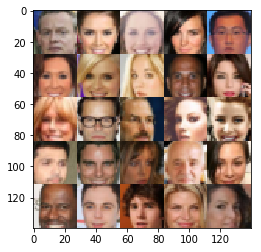

In [3]:
show_n_images = 25

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    inputs_real = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    return inputs_real, inputs_z, learning_rate

tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 497, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/tornado/ioloop.py", line 832, in start\n    self._run_callback(self._callbacks.popleft())', 'File

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    alpha = 0.2
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # using 4 layer network as in DCGAN Paper
        
        # Conv 1
        conv1 = tf.layers.conv2d(images, 64, 5, 2, 'SAME')
        lrelu1 = tf.maximum(alpha * conv1, conv1)
        
        # Conv 2
        conv2 = tf.layers.conv2d(lrelu1, 128, 5, 2, 'SAME')
        batch_norm2 = tf.layers.batch_normalization(conv2, training=True)
        lrelu2 = tf.maximum(alpha * batch_norm2, batch_norm2)
        
        # Conv 3
        conv3 = tf.layers.conv2d(lrelu2, 256, 5, 1, 'SAME')
        batch_norm3 = tf.layers.batch_normalization(conv3, training=True)
        lrelu3 = tf.maximum(alpha * batch_norm3, batch_norm3)
        
        # Conv 4
        conv4 = tf.layers.conv2d(lrelu3, 512, 5, 1, 'SAME')
        batch_norm4 = tf.layers.batch_normalization(conv4, training=True)
        lrelu4 = tf.maximum(alpha * batch_norm4, batch_norm4)
       
        # Flatten
        flat = tf.reshape(lrelu4, (-1, 7*7*512))
        
        # Logits
        logits = tf.layers.dense(flat, 1)
        
        # Output
        out = tf.sigmoid(logits)
        
        return out, logits

tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    alpha = 0.2
    
    with tf.variable_scope('generator', reuse=False if is_train==True else True):
        # Fully connected
        fc1 = tf.layers.dense(z, 7*7*512)
        fc1 = tf.reshape(fc1, (-1, 7, 7, 512))
        fc1 = tf.maximum(alpha*fc1, fc1)
        
        # Starting Conv Transpose Stack
        deconv2 = tf.layers.conv2d_transpose(fc1, 256, 3, 1, 'SAME')
        batch_norm2 = tf.layers.batch_normalization(deconv2, training=is_train)
        lrelu2 = tf.maximum(alpha * batch_norm2, batch_norm2)
        
        deconv3 = tf.layers.conv2d_transpose(lrelu2, 128, 3, 1, 'SAME')
        batch_norm3 = tf.layers.batch_normalization(deconv3, training=is_train)
        lrelu3 = tf.maximum(alpha * batch_norm3, batch_norm3)
        
        deconv4 = tf.layers.conv2d_transpose(lrelu3, 64, 3, 2, 'SAME')
        batch_norm4 = tf.layers.batch_normalization(deconv4, training=is_train)
        lrelu4 = tf.maximum(alpha * batch_norm4, batch_norm4)
        
        # Logits
        logits = tf.layers.conv2d_transpose(lrelu4, out_channel_dim, 3, 2, 'SAME')
        
        # Output
        out = tf.tanh(logits)
        
        return out

tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
                      tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                              labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
                      tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                              labels=tf.zeros_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake

    g_loss = tf.reduce_mean(
                 tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                         labels=tf.ones_like(d_model_fake)))
    
    return d_loss, g_loss

tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1, beta2=0.9).minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1, beta2=0.9).minimize(g_loss, var_list=g_vars)
    return d_train_opt, g_train_opt

tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    steps = 0
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height,image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    is_train = tf.placeholder(tf.bool)
        
         
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                 # Run optimizers
                _ = sess.run(d_opt,
                             feed_dict={input_z: batch_z,
                                        input_real: batch_images,
                                        lr: learning_rate})
                _ = sess.run(g_opt, 
                             feed_dict={input_z: batch_z, 
                                        input_real: batch_images,
                                        lr: learning_rate})
                                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    #Print the current image
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 19.3776... Generator Loss: 1.2805
Epoch 1/2... Discriminator Loss: 46.7883... Generator Loss: 0.2070
Epoch 1/2... Discriminator Loss: 3.5834... Generator Loss: 10.5925
Epoch 1/2... Discriminator Loss: 5.9431... Generator Loss: 2.4844
Epoch 1/2... Discriminator Loss: 11.0562... Generator Loss: 4.5936
Epoch 1/2... Discriminator Loss: 5.6421... Generator Loss: 3.5762
Epoch 1/2... Discriminator Loss: 7.4901... Generator Loss: 7.4123
Epoch 1/2... Discriminator Loss: 2.9283... Generator Loss: 2.2082
Epoch 1/2... Discriminator Loss: 4.4156... Generator Loss: 4.4101
Epoch 1/2... Discriminator Loss: 2.4429... Generator Loss: 2.0588


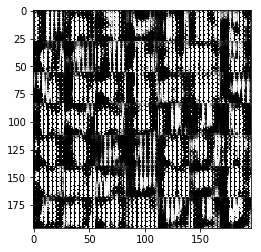

Epoch 1/2... Discriminator Loss: 6.2560... Generator Loss: 1.0921
Epoch 1/2... Discriminator Loss: 1.2998... Generator Loss: 4.1886
Epoch 1/2... Discriminator Loss: 4.1233... Generator Loss: 7.7511
Epoch 1/2... Discriminator Loss: 10.9162... Generator Loss: 6.6334
Epoch 1/2... Discriminator Loss: 4.3615... Generator Loss: 5.2230
Epoch 1/2... Discriminator Loss: 4.5009... Generator Loss: 6.6986
Epoch 1/2... Discriminator Loss: 2.3576... Generator Loss: 6.6741
Epoch 1/2... Discriminator Loss: 0.8131... Generator Loss: 5.5067
Epoch 1/2... Discriminator Loss: 5.3222... Generator Loss: 0.1022
Epoch 1/2... Discriminator Loss: 6.1475... Generator Loss: 0.0516


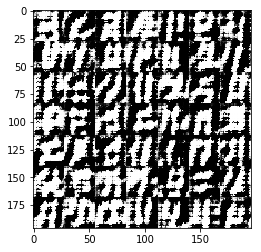

Epoch 1/2... Discriminator Loss: 2.9292... Generator Loss: 0.2000
Epoch 1/2... Discriminator Loss: 4.4272... Generator Loss: 6.4985
Epoch 1/2... Discriminator Loss: 3.0093... Generator Loss: 0.4626
Epoch 1/2... Discriminator Loss: 1.9412... Generator Loss: 0.6900
Epoch 1/2... Discriminator Loss: 5.4421... Generator Loss: 0.1022
Epoch 1/2... Discriminator Loss: 1.7345... Generator Loss: 0.5015
Epoch 1/2... Discriminator Loss: 2.8254... Generator Loss: 5.7901
Epoch 1/2... Discriminator Loss: 4.9480... Generator Loss: 0.0652
Epoch 1/2... Discriminator Loss: 1.8929... Generator Loss: 2.1183
Epoch 1/2... Discriminator Loss: 1.8648... Generator Loss: 2.3709


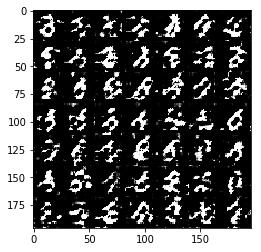

Epoch 1/2... Discriminator Loss: 1.1962... Generator Loss: 0.8910
Epoch 1/2... Discriminator Loss: 1.6580... Generator Loss: 1.3860
Epoch 1/2... Discriminator Loss: 3.1877... Generator Loss: 0.0901
Epoch 1/2... Discriminator Loss: 1.0570... Generator Loss: 0.7539
Epoch 1/2... Discriminator Loss: 0.7811... Generator Loss: 1.7414
Epoch 1/2... Discriminator Loss: 2.1092... Generator Loss: 0.2397
Epoch 1/2... Discriminator Loss: 1.7445... Generator Loss: 0.3709
Epoch 1/2... Discriminator Loss: 1.7117... Generator Loss: 1.3925
Epoch 1/2... Discriminator Loss: 1.8986... Generator Loss: 0.2783
Epoch 1/2... Discriminator Loss: 1.3705... Generator Loss: 0.6733


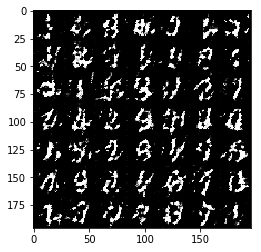

Epoch 1/2... Discriminator Loss: 1.2290... Generator Loss: 0.8388
Epoch 1/2... Discriminator Loss: 1.7353... Generator Loss: 0.4001
Epoch 1/2... Discriminator Loss: 2.0287... Generator Loss: 0.2708
Epoch 1/2... Discriminator Loss: 1.1137... Generator Loss: 0.7669
Epoch 1/2... Discriminator Loss: 1.3600... Generator Loss: 0.6979
Epoch 1/2... Discriminator Loss: 1.2876... Generator Loss: 0.8955
Epoch 1/2... Discriminator Loss: 1.3048... Generator Loss: 1.0350
Epoch 1/2... Discriminator Loss: 1.9592... Generator Loss: 0.2713
Epoch 1/2... Discriminator Loss: 2.2476... Generator Loss: 0.1972
Epoch 1/2... Discriminator Loss: 1.3481... Generator Loss: 0.8641


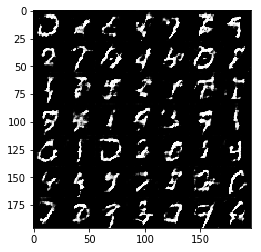

Epoch 1/2... Discriminator Loss: 1.2847... Generator Loss: 1.4588
Epoch 1/2... Discriminator Loss: 1.8194... Generator Loss: 0.2994
Epoch 1/2... Discriminator Loss: 1.5100... Generator Loss: 0.4636
Epoch 1/2... Discriminator Loss: 1.4243... Generator Loss: 1.3200
Epoch 1/2... Discriminator Loss: 1.2446... Generator Loss: 1.2558
Epoch 1/2... Discriminator Loss: 1.2591... Generator Loss: 1.4087
Epoch 1/2... Discriminator Loss: 1.5614... Generator Loss: 1.8954
Epoch 1/2... Discriminator Loss: 1.0923... Generator Loss: 1.1668
Epoch 1/2... Discriminator Loss: 1.3902... Generator Loss: 0.6952
Epoch 1/2... Discriminator Loss: 1.3591... Generator Loss: 0.6224


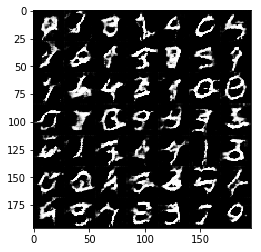

Epoch 1/2... Discriminator Loss: 1.4867... Generator Loss: 0.5087
Epoch 1/2... Discriminator Loss: 1.3489... Generator Loss: 0.6307
Epoch 1/2... Discriminator Loss: 1.5243... Generator Loss: 0.4708
Epoch 1/2... Discriminator Loss: 1.2729... Generator Loss: 1.3756
Epoch 1/2... Discriminator Loss: 1.4852... Generator Loss: 0.4620
Epoch 1/2... Discriminator Loss: 1.9041... Generator Loss: 0.3066
Epoch 1/2... Discriminator Loss: 1.5277... Generator Loss: 0.4246
Epoch 1/2... Discriminator Loss: 1.2407... Generator Loss: 0.6505
Epoch 1/2... Discriminator Loss: 1.4261... Generator Loss: 0.5588
Epoch 1/2... Discriminator Loss: 1.3363... Generator Loss: 0.6157


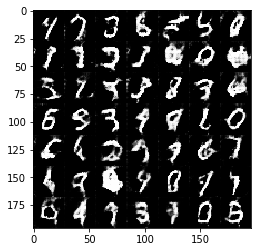

Epoch 1/2... Discriminator Loss: 1.8740... Generator Loss: 0.2771
Epoch 1/2... Discriminator Loss: 1.6496... Generator Loss: 0.4009
Epoch 1/2... Discriminator Loss: 1.2085... Generator Loss: 0.6444
Epoch 1/2... Discriminator Loss: 1.2474... Generator Loss: 0.6899
Epoch 1/2... Discriminator Loss: 1.5186... Generator Loss: 0.4776
Epoch 1/2... Discriminator Loss: 1.1411... Generator Loss: 0.9904
Epoch 1/2... Discriminator Loss: 1.5643... Generator Loss: 0.5026
Epoch 1/2... Discriminator Loss: 1.2272... Generator Loss: 0.7110
Epoch 1/2... Discriminator Loss: 1.1810... Generator Loss: 1.0463
Epoch 1/2... Discriminator Loss: 1.8283... Generator Loss: 0.2941


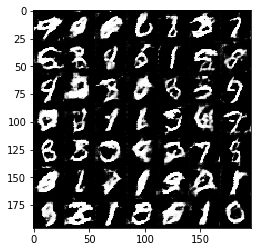

Epoch 1/2... Discriminator Loss: 1.4697... Generator Loss: 0.4750
Epoch 1/2... Discriminator Loss: 1.2788... Generator Loss: 1.7051
Epoch 1/2... Discriminator Loss: 1.3770... Generator Loss: 0.5426
Epoch 1/2... Discriminator Loss: 1.2740... Generator Loss: 0.7834
Epoch 1/2... Discriminator Loss: 1.2631... Generator Loss: 0.7328
Epoch 1/2... Discriminator Loss: 1.2143... Generator Loss: 0.6991
Epoch 1/2... Discriminator Loss: 1.6292... Generator Loss: 0.4404
Epoch 1/2... Discriminator Loss: 1.3229... Generator Loss: 1.3970
Epoch 1/2... Discriminator Loss: 1.1562... Generator Loss: 1.3902
Epoch 1/2... Discriminator Loss: 1.2333... Generator Loss: 1.1362


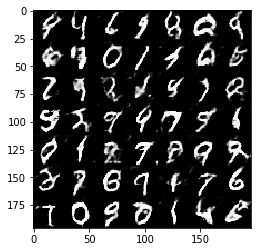

Epoch 1/2... Discriminator Loss: 1.2280... Generator Loss: 0.8565
Epoch 1/2... Discriminator Loss: 1.2918... Generator Loss: 0.9459
Epoch 1/2... Discriminator Loss: 1.6175... Generator Loss: 0.3894
Epoch 1/2... Discriminator Loss: 1.3029... Generator Loss: 1.4966
Epoch 1/2... Discriminator Loss: 1.1698... Generator Loss: 1.3132
Epoch 1/2... Discriminator Loss: 1.0757... Generator Loss: 1.9769
Epoch 1/2... Discriminator Loss: 1.2669... Generator Loss: 1.9279
Epoch 1/2... Discriminator Loss: 1.0274... Generator Loss: 1.6193
Epoch 1/2... Discriminator Loss: 0.9831... Generator Loss: 0.9517
Epoch 1/2... Discriminator Loss: 1.5711... Generator Loss: 0.4059


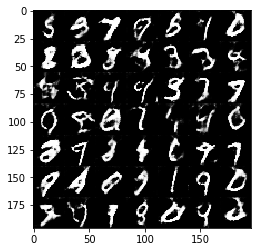

Epoch 1/2... Discriminator Loss: 1.6807... Generator Loss: 0.4560
Epoch 1/2... Discriminator Loss: 1.7043... Generator Loss: 0.4038
Epoch 1/2... Discriminator Loss: 1.4210... Generator Loss: 1.6478
Epoch 1/2... Discriminator Loss: 1.5286... Generator Loss: 0.4181
Epoch 1/2... Discriminator Loss: 1.9788... Generator Loss: 0.2677
Epoch 1/2... Discriminator Loss: 1.6908... Generator Loss: 0.3969
Epoch 1/2... Discriminator Loss: 1.3069... Generator Loss: 0.6491
Epoch 1/2... Discriminator Loss: 1.7742... Generator Loss: 0.4194
Epoch 1/2... Discriminator Loss: 1.2180... Generator Loss: 1.4406
Epoch 1/2... Discriminator Loss: 1.3154... Generator Loss: 0.6144


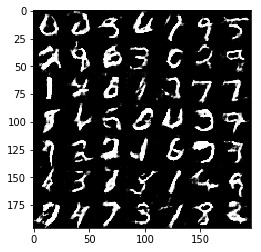

Epoch 1/2... Discriminator Loss: 1.6122... Generator Loss: 0.4442
Epoch 1/2... Discriminator Loss: 2.0194... Generator Loss: 0.2766
Epoch 1/2... Discriminator Loss: 1.0170... Generator Loss: 0.8893
Epoch 1/2... Discriminator Loss: 1.6013... Generator Loss: 0.5668
Epoch 1/2... Discriminator Loss: 0.8678... Generator Loss: 2.1117
Epoch 1/2... Discriminator Loss: 1.5868... Generator Loss: 0.4524
Epoch 1/2... Discriminator Loss: 1.1771... Generator Loss: 0.7428
Epoch 1/2... Discriminator Loss: 1.8368... Generator Loss: 0.4355
Epoch 1/2... Discriminator Loss: 1.9146... Generator Loss: 0.3397
Epoch 1/2... Discriminator Loss: 1.1498... Generator Loss: 0.7636


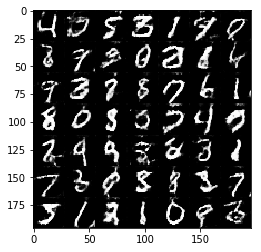

Epoch 1/2... Discriminator Loss: 1.4711... Generator Loss: 0.5252
Epoch 1/2... Discriminator Loss: 2.4605... Generator Loss: 0.1915
Epoch 1/2... Discriminator Loss: 0.9358... Generator Loss: 1.7416
Epoch 1/2... Discriminator Loss: 1.1251... Generator Loss: 2.0185
Epoch 1/2... Discriminator Loss: 0.8981... Generator Loss: 1.6136
Epoch 1/2... Discriminator Loss: 1.4512... Generator Loss: 0.6339
Epoch 1/2... Discriminator Loss: 1.7872... Generator Loss: 0.4082
Epoch 1/2... Discriminator Loss: 1.0942... Generator Loss: 0.9943
Epoch 1/2... Discriminator Loss: 1.2024... Generator Loss: 1.6028
Epoch 1/2... Discriminator Loss: 0.9209... Generator Loss: 1.9560


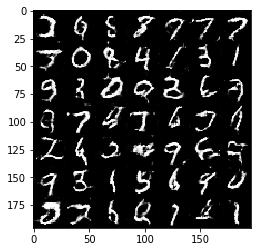

Epoch 1/2... Discriminator Loss: 1.2981... Generator Loss: 0.6331
Epoch 1/2... Discriminator Loss: 1.7725... Generator Loss: 0.3471
Epoch 1/2... Discriminator Loss: 1.2103... Generator Loss: 1.4672
Epoch 1/2... Discriminator Loss: 2.0863... Generator Loss: 0.3340
Epoch 1/2... Discriminator Loss: 0.8196... Generator Loss: 1.1217
Epoch 1/2... Discriminator Loss: 0.9683... Generator Loss: 1.6514
Epoch 1/2... Discriminator Loss: 2.0204... Generator Loss: 2.8922
Epoch 1/2... Discriminator Loss: 0.9990... Generator Loss: 1.9819
Epoch 1/2... Discriminator Loss: 1.8702... Generator Loss: 0.3326
Epoch 1/2... Discriminator Loss: 1.3964... Generator Loss: 2.0616


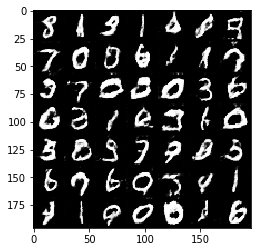

Epoch 1/2... Discriminator Loss: 1.0304... Generator Loss: 1.1724
Epoch 1/2... Discriminator Loss: 1.0643... Generator Loss: 0.8922
Epoch 1/2... Discriminator Loss: 1.2153... Generator Loss: 0.7900
Epoch 1/2... Discriminator Loss: 1.3784... Generator Loss: 0.6955
Epoch 1/2... Discriminator Loss: 0.9612... Generator Loss: 1.4203
Epoch 1/2... Discriminator Loss: 1.8755... Generator Loss: 0.3786
Epoch 1/2... Discriminator Loss: 2.9543... Generator Loss: 0.1065
Epoch 1/2... Discriminator Loss: 1.2491... Generator Loss: 0.6544
Epoch 1/2... Discriminator Loss: 0.9999... Generator Loss: 1.2023
Epoch 1/2... Discriminator Loss: 1.6217... Generator Loss: 0.4910


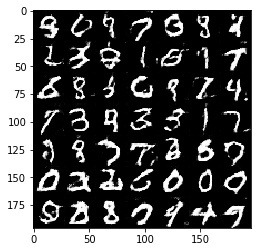

Epoch 1/2... Discriminator Loss: 1.3221... Generator Loss: 0.6469
Epoch 1/2... Discriminator Loss: 1.0226... Generator Loss: 1.0113
Epoch 1/2... Discriminator Loss: 1.0755... Generator Loss: 0.8782
Epoch 1/2... Discriminator Loss: 1.1473... Generator Loss: 0.7325
Epoch 1/2... Discriminator Loss: 0.9937... Generator Loss: 1.5828
Epoch 1/2... Discriminator Loss: 0.7612... Generator Loss: 1.5359
Epoch 1/2... Discriminator Loss: 1.5999... Generator Loss: 0.4673
Epoch 1/2... Discriminator Loss: 1.5739... Generator Loss: 0.4272
Epoch 1/2... Discriminator Loss: 1.6765... Generator Loss: 0.4287
Epoch 1/2... Discriminator Loss: 1.8956... Generator Loss: 0.3807


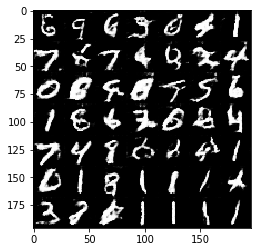

Epoch 1/2... Discriminator Loss: 1.7767... Generator Loss: 2.5407
Epoch 1/2... Discriminator Loss: 2.3283... Generator Loss: 0.2461
Epoch 1/2... Discriminator Loss: 1.6577... Generator Loss: 0.4636
Epoch 1/2... Discriminator Loss: 1.2334... Generator Loss: 2.3643
Epoch 1/2... Discriminator Loss: 1.5021... Generator Loss: 0.5800
Epoch 1/2... Discriminator Loss: 1.1663... Generator Loss: 0.8860
Epoch 1/2... Discriminator Loss: 1.2150... Generator Loss: 0.6767
Epoch 1/2... Discriminator Loss: 1.3902... Generator Loss: 0.7168
Epoch 1/2... Discriminator Loss: 1.1617... Generator Loss: 0.8350
Epoch 1/2... Discriminator Loss: 0.9423... Generator Loss: 1.4032


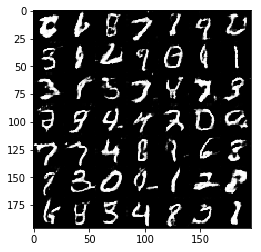

Epoch 1/2... Discriminator Loss: 0.8819... Generator Loss: 2.1595
Epoch 1/2... Discriminator Loss: 1.4312... Generator Loss: 0.6169
Epoch 1/2... Discriminator Loss: 1.3630... Generator Loss: 0.6545
Epoch 1/2... Discriminator Loss: 1.9782... Generator Loss: 0.3127
Epoch 1/2... Discriminator Loss: 0.7911... Generator Loss: 1.5219
Epoch 1/2... Discriminator Loss: 1.9376... Generator Loss: 0.3700
Epoch 1/2... Discriminator Loss: 1.1261... Generator Loss: 0.8989
Epoch 1/2... Discriminator Loss: 0.8094... Generator Loss: 1.7179
Epoch 1/2... Discriminator Loss: 1.5435... Generator Loss: 0.5848
Epoch 1/2... Discriminator Loss: 0.9003... Generator Loss: 1.7745


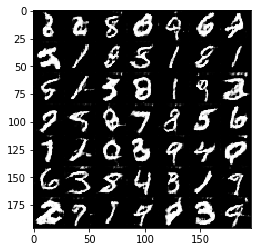

Epoch 1/2... Discriminator Loss: 2.0531... Generator Loss: 0.3181
Epoch 1/2... Discriminator Loss: 1.6793... Generator Loss: 3.2075
Epoch 1/2... Discriminator Loss: 1.0641... Generator Loss: 1.3574
Epoch 1/2... Discriminator Loss: 1.0231... Generator Loss: 1.3332
Epoch 1/2... Discriminator Loss: 0.9465... Generator Loss: 1.5014
Epoch 1/2... Discriminator Loss: 1.8093... Generator Loss: 2.6182
Epoch 1/2... Discriminator Loss: 1.8208... Generator Loss: 0.3917
Epoch 2/2... Discriminator Loss: 0.8218... Generator Loss: 1.4045
Epoch 2/2... Discriminator Loss: 0.9455... Generator Loss: 1.2311
Epoch 2/2... Discriminator Loss: 2.7335... Generator Loss: 0.2011


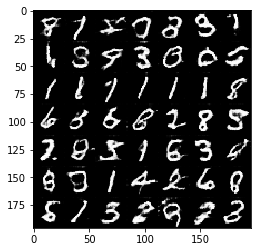

Epoch 2/2... Discriminator Loss: 1.3646... Generator Loss: 0.5260
Epoch 2/2... Discriminator Loss: 0.8664... Generator Loss: 1.1951
Epoch 2/2... Discriminator Loss: 1.2860... Generator Loss: 1.1864
Epoch 2/2... Discriminator Loss: 1.5312... Generator Loss: 0.5168
Epoch 2/2... Discriminator Loss: 0.9274... Generator Loss: 1.1778
Epoch 2/2... Discriminator Loss: 1.2453... Generator Loss: 1.8270
Epoch 2/2... Discriminator Loss: 3.0574... Generator Loss: 0.1238
Epoch 2/2... Discriminator Loss: 2.0311... Generator Loss: 0.3663
Epoch 2/2... Discriminator Loss: 1.6593... Generator Loss: 0.3967
Epoch 2/2... Discriminator Loss: 0.8105... Generator Loss: 1.4008


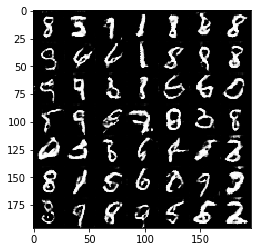

Epoch 2/2... Discriminator Loss: 1.1706... Generator Loss: 0.8529
Epoch 2/2... Discriminator Loss: 1.5218... Generator Loss: 0.9357
Epoch 2/2... Discriminator Loss: 0.9851... Generator Loss: 1.0675
Epoch 2/2... Discriminator Loss: 0.9321... Generator Loss: 1.2782
Epoch 2/2... Discriminator Loss: 2.3112... Generator Loss: 0.2484
Epoch 2/2... Discriminator Loss: 1.9242... Generator Loss: 0.3360
Epoch 2/2... Discriminator Loss: 1.1927... Generator Loss: 0.7568
Epoch 2/2... Discriminator Loss: 2.3977... Generator Loss: 0.2126
Epoch 2/2... Discriminator Loss: 0.9767... Generator Loss: 1.0417
Epoch 2/2... Discriminator Loss: 1.2198... Generator Loss: 0.7910


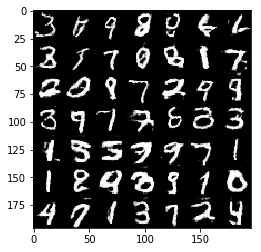

Epoch 2/2... Discriminator Loss: 2.0808... Generator Loss: 0.2658
Epoch 2/2... Discriminator Loss: 1.6934... Generator Loss: 0.4467
Epoch 2/2... Discriminator Loss: 0.9374... Generator Loss: 1.6510
Epoch 2/2... Discriminator Loss: 2.2076... Generator Loss: 0.2617
Epoch 2/2... Discriminator Loss: 2.9694... Generator Loss: 0.1457
Epoch 2/2... Discriminator Loss: 1.0257... Generator Loss: 1.0424
Epoch 2/2... Discriminator Loss: 1.0613... Generator Loss: 1.3274
Epoch 2/2... Discriminator Loss: 1.5480... Generator Loss: 0.6740
Epoch 2/2... Discriminator Loss: 1.4042... Generator Loss: 0.5912
Epoch 2/2... Discriminator Loss: 1.0413... Generator Loss: 1.2976


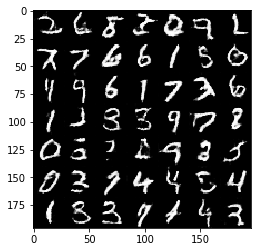

Epoch 2/2... Discriminator Loss: 0.7307... Generator Loss: 2.2073
Epoch 2/2... Discriminator Loss: 2.1253... Generator Loss: 0.2876
Epoch 2/2... Discriminator Loss: 0.9125... Generator Loss: 1.4088
Epoch 2/2... Discriminator Loss: 1.1763... Generator Loss: 0.9318
Epoch 2/2... Discriminator Loss: 0.6992... Generator Loss: 1.5209
Epoch 2/2... Discriminator Loss: 1.2575... Generator Loss: 1.8039
Epoch 2/2... Discriminator Loss: 2.1094... Generator Loss: 0.3666
Epoch 2/2... Discriminator Loss: 1.8446... Generator Loss: 0.3587
Epoch 2/2... Discriminator Loss: 1.0979... Generator Loss: 1.5796
Epoch 2/2... Discriminator Loss: 2.5872... Generator Loss: 0.1841


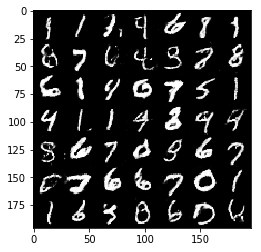

Epoch 2/2... Discriminator Loss: 1.1540... Generator Loss: 2.1650
Epoch 2/2... Discriminator Loss: 1.8002... Generator Loss: 0.3429
Epoch 2/2... Discriminator Loss: 0.9554... Generator Loss: 1.0563
Epoch 2/2... Discriminator Loss: 1.6504... Generator Loss: 0.4462
Epoch 2/2... Discriminator Loss: 1.1303... Generator Loss: 1.0894
Epoch 2/2... Discriminator Loss: 0.7888... Generator Loss: 1.2614
Epoch 2/2... Discriminator Loss: 1.3091... Generator Loss: 0.7317
Epoch 2/2... Discriminator Loss: 0.9385... Generator Loss: 1.1556
Epoch 2/2... Discriminator Loss: 1.6150... Generator Loss: 0.5110
Epoch 2/2... Discriminator Loss: 1.6785... Generator Loss: 0.5818


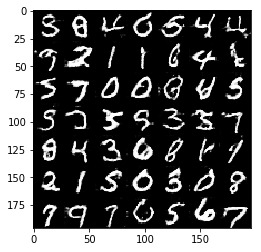

Epoch 2/2... Discriminator Loss: 1.5713... Generator Loss: 0.5484
Epoch 2/2... Discriminator Loss: 1.7803... Generator Loss: 0.4595
Epoch 2/2... Discriminator Loss: 0.9531... Generator Loss: 1.1934
Epoch 2/2... Discriminator Loss: 2.0894... Generator Loss: 0.2912
Epoch 2/2... Discriminator Loss: 1.5681... Generator Loss: 0.5250
Epoch 2/2... Discriminator Loss: 1.3487... Generator Loss: 0.7133
Epoch 2/2... Discriminator Loss: 2.9845... Generator Loss: 0.1162
Epoch 2/2... Discriminator Loss: 1.5253... Generator Loss: 0.5598
Epoch 2/2... Discriminator Loss: 0.7660... Generator Loss: 1.8974
Epoch 2/2... Discriminator Loss: 0.9873... Generator Loss: 1.9601


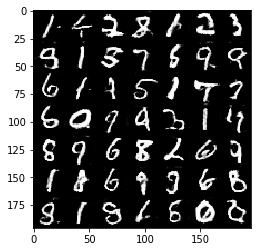

Epoch 2/2... Discriminator Loss: 1.2146... Generator Loss: 2.1723
Epoch 2/2... Discriminator Loss: 1.9247... Generator Loss: 0.3647
Epoch 2/2... Discriminator Loss: 1.1758... Generator Loss: 1.9521
Epoch 2/2... Discriminator Loss: 1.2040... Generator Loss: 0.9138
Epoch 2/2... Discriminator Loss: 4.7708... Generator Loss: 0.0409
Epoch 2/2... Discriminator Loss: 1.3667... Generator Loss: 0.5841
Epoch 2/2... Discriminator Loss: 1.1659... Generator Loss: 0.8057
Epoch 2/2... Discriminator Loss: 1.7447... Generator Loss: 0.4179
Epoch 2/2... Discriminator Loss: 2.3370... Generator Loss: 0.3536
Epoch 2/2... Discriminator Loss: 1.1386... Generator Loss: 0.9195


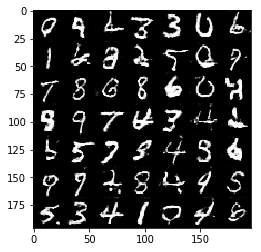

Epoch 2/2... Discriminator Loss: 1.7856... Generator Loss: 0.4075
Epoch 2/2... Discriminator Loss: 3.4756... Generator Loss: 0.0823
Epoch 2/2... Discriminator Loss: 2.6516... Generator Loss: 0.1910
Epoch 2/2... Discriminator Loss: 1.0653... Generator Loss: 0.8727
Epoch 2/2... Discriminator Loss: 1.1429... Generator Loss: 2.0897
Epoch 2/2... Discriminator Loss: 1.4801... Generator Loss: 2.9343
Epoch 2/2... Discriminator Loss: 2.3023... Generator Loss: 0.2596
Epoch 2/2... Discriminator Loss: 1.2622... Generator Loss: 2.0402
Epoch 2/2... Discriminator Loss: 0.5658... Generator Loss: 1.9647
Epoch 2/2... Discriminator Loss: 0.8451... Generator Loss: 1.3832


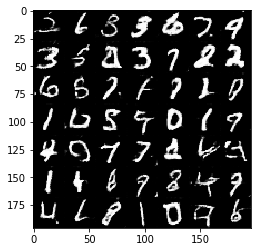

Epoch 2/2... Discriminator Loss: 0.6498... Generator Loss: 1.8035
Epoch 2/2... Discriminator Loss: 2.4953... Generator Loss: 0.2039
Epoch 2/2... Discriminator Loss: 1.6405... Generator Loss: 2.5288
Epoch 2/2... Discriminator Loss: 1.5388... Generator Loss: 0.4614
Epoch 2/2... Discriminator Loss: 1.1608... Generator Loss: 0.7607
Epoch 2/2... Discriminator Loss: 1.2812... Generator Loss: 0.7821
Epoch 2/2... Discriminator Loss: 1.3687... Generator Loss: 1.8157
Epoch 2/2... Discriminator Loss: 1.8931... Generator Loss: 0.3349
Epoch 2/2... Discriminator Loss: 1.0651... Generator Loss: 1.2354
Epoch 2/2... Discriminator Loss: 3.6311... Generator Loss: 0.0911


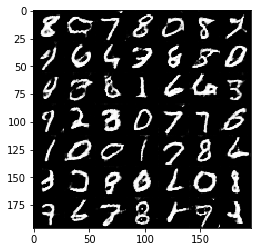

Epoch 2/2... Discriminator Loss: 1.6493... Generator Loss: 0.3924
Epoch 2/2... Discriminator Loss: 0.9129... Generator Loss: 2.4902
Epoch 2/2... Discriminator Loss: 1.5300... Generator Loss: 0.5098
Epoch 2/2... Discriminator Loss: 1.0322... Generator Loss: 0.9413
Epoch 2/2... Discriminator Loss: 1.3030... Generator Loss: 0.6813
Epoch 2/2... Discriminator Loss: 1.1639... Generator Loss: 0.7709
Epoch 2/2... Discriminator Loss: 1.2278... Generator Loss: 0.8094
Epoch 2/2... Discriminator Loss: 3.1487... Generator Loss: 0.1484
Epoch 2/2... Discriminator Loss: 1.4070... Generator Loss: 0.8813
Epoch 2/2... Discriminator Loss: 1.0196... Generator Loss: 2.3862


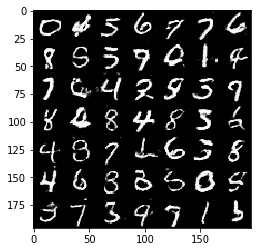

Epoch 2/2... Discriminator Loss: 1.0007... Generator Loss: 0.9959
Epoch 2/2... Discriminator Loss: 1.1377... Generator Loss: 0.7479
Epoch 2/2... Discriminator Loss: 1.5068... Generator Loss: 3.2276
Epoch 2/2... Discriminator Loss: 0.8319... Generator Loss: 1.1853
Epoch 2/2... Discriminator Loss: 1.9565... Generator Loss: 2.8198
Epoch 2/2... Discriminator Loss: 1.1046... Generator Loss: 1.1425
Epoch 2/2... Discriminator Loss: 1.2738... Generator Loss: 2.8942
Epoch 2/2... Discriminator Loss: 0.9991... Generator Loss: 0.9077
Epoch 2/2... Discriminator Loss: 0.8168... Generator Loss: 1.2633
Epoch 2/2... Discriminator Loss: 1.3060... Generator Loss: 0.6066


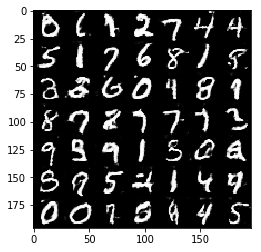

Epoch 2/2... Discriminator Loss: 2.6220... Generator Loss: 0.1917
Epoch 2/2... Discriminator Loss: 1.6390... Generator Loss: 0.4842
Epoch 2/2... Discriminator Loss: 1.1813... Generator Loss: 1.7596
Epoch 2/2... Discriminator Loss: 1.0935... Generator Loss: 0.8795
Epoch 2/2... Discriminator Loss: 1.3005... Generator Loss: 0.6556
Epoch 2/2... Discriminator Loss: 1.0969... Generator Loss: 1.9750
Epoch 2/2... Discriminator Loss: 2.1739... Generator Loss: 0.2983
Epoch 2/2... Discriminator Loss: 1.1380... Generator Loss: 0.8688
Epoch 2/2... Discriminator Loss: 1.0097... Generator Loss: 2.5486
Epoch 2/2... Discriminator Loss: 1.4107... Generator Loss: 2.1604


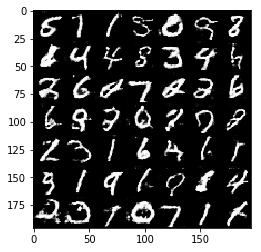

Epoch 2/2... Discriminator Loss: 1.9560... Generator Loss: 0.3223
Epoch 2/2... Discriminator Loss: 1.0997... Generator Loss: 0.8595
Epoch 2/2... Discriminator Loss: 1.7066... Generator Loss: 0.4305
Epoch 2/2... Discriminator Loss: 1.0832... Generator Loss: 1.1832
Epoch 2/2... Discriminator Loss: 0.8496... Generator Loss: 1.0295
Epoch 2/2... Discriminator Loss: 1.3974... Generator Loss: 0.8499
Epoch 2/2... Discriminator Loss: 1.5922... Generator Loss: 0.4538
Epoch 2/2... Discriminator Loss: 1.2015... Generator Loss: 0.7171
Epoch 2/2... Discriminator Loss: 1.1570... Generator Loss: 2.9785
Epoch 2/2... Discriminator Loss: 1.5149... Generator Loss: 0.4965


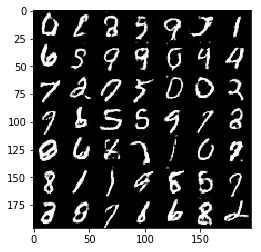

Epoch 2/2... Discriminator Loss: 0.9244... Generator Loss: 1.1958
Epoch 2/2... Discriminator Loss: 3.3333... Generator Loss: 0.1367
Epoch 2/2... Discriminator Loss: 1.1988... Generator Loss: 1.6907
Epoch 2/2... Discriminator Loss: 1.0478... Generator Loss: 1.2116
Epoch 2/2... Discriminator Loss: 2.1293... Generator Loss: 3.7133
Epoch 2/2... Discriminator Loss: 1.1452... Generator Loss: 1.4342
Epoch 2/2... Discriminator Loss: 2.6034... Generator Loss: 0.2519
Epoch 2/2... Discriminator Loss: 1.7641... Generator Loss: 0.4687
Epoch 2/2... Discriminator Loss: 1.2074... Generator Loss: 0.7763
Epoch 2/2... Discriminator Loss: 1.3951... Generator Loss: 0.5368


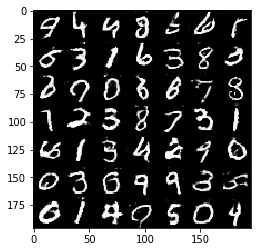

Epoch 2/2... Discriminator Loss: 0.8648... Generator Loss: 1.1005
Epoch 2/2... Discriminator Loss: 1.6173... Generator Loss: 0.5336
Epoch 2/2... Discriminator Loss: 0.9846... Generator Loss: 1.8972
Epoch 2/2... Discriminator Loss: 2.9260... Generator Loss: 0.1743
Epoch 2/2... Discriminator Loss: 1.0195... Generator Loss: 1.1716
Epoch 2/2... Discriminator Loss: 0.8939... Generator Loss: 1.2765
Epoch 2/2... Discriminator Loss: 3.4923... Generator Loss: 0.0797
Epoch 2/2... Discriminator Loss: 0.8651... Generator Loss: 1.2753
Epoch 2/2... Discriminator Loss: 3.1080... Generator Loss: 0.1552
Epoch 2/2... Discriminator Loss: 1.2070... Generator Loss: 0.8019


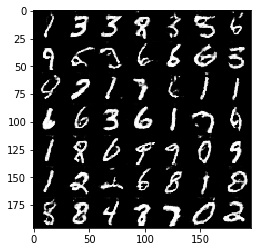

Epoch 2/2... Discriminator Loss: 1.9414... Generator Loss: 3.1923
Epoch 2/2... Discriminator Loss: 1.2115... Generator Loss: 0.6916
Epoch 2/2... Discriminator Loss: 2.7047... Generator Loss: 0.1792
Epoch 2/2... Discriminator Loss: 1.0183... Generator Loss: 2.3146
Epoch 2/2... Discriminator Loss: 0.8767... Generator Loss: 1.0442
Epoch 2/2... Discriminator Loss: 1.0813... Generator Loss: 1.1890
Epoch 2/2... Discriminator Loss: 2.9559... Generator Loss: 0.1570
Epoch 2/2... Discriminator Loss: 0.9917... Generator Loss: 1.5637
Epoch 2/2... Discriminator Loss: 1.2235... Generator Loss: 0.7351
Epoch 2/2... Discriminator Loss: 1.1236... Generator Loss: 2.4232


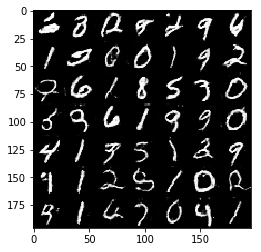

Epoch 2/2... Discriminator Loss: 1.2325... Generator Loss: 1.3103
Epoch 2/2... Discriminator Loss: 1.3029... Generator Loss: 0.7367
Epoch 2/2... Discriminator Loss: 2.9431... Generator Loss: 0.1929
Epoch 2/2... Discriminator Loss: 1.5152... Generator Loss: 0.5572
Epoch 2/2... Discriminator Loss: 1.8772... Generator Loss: 0.4630
Epoch 2/2... Discriminator Loss: 1.6256... Generator Loss: 0.4747
Epoch 2/2... Discriminator Loss: 2.1375... Generator Loss: 0.2787
Epoch 2/2... Discriminator Loss: 1.1098... Generator Loss: 1.4056
Epoch 2/2... Discriminator Loss: 3.4170... Generator Loss: 0.0898
Epoch 2/2... Discriminator Loss: 3.5941... Generator Loss: 0.0718


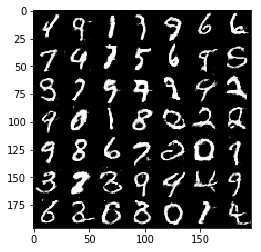

Epoch 2/2... Discriminator Loss: 1.5481... Generator Loss: 0.5168
Epoch 2/2... Discriminator Loss: 0.8352... Generator Loss: 1.1023
Epoch 2/2... Discriminator Loss: 2.5992... Generator Loss: 0.2123
Epoch 2/2... Discriminator Loss: 1.5439... Generator Loss: 0.5399
Epoch 2/2... Discriminator Loss: 1.6574... Generator Loss: 0.4474
Epoch 2/2... Discriminator Loss: 0.7129... Generator Loss: 2.1298
Epoch 2/2... Discriminator Loss: 0.9977... Generator Loss: 2.1678
Epoch 2/2... Discriminator Loss: 0.7387... Generator Loss: 1.8404
Epoch 2/2... Discriminator Loss: 1.0871... Generator Loss: 2.4795
Epoch 2/2... Discriminator Loss: 0.9103... Generator Loss: 1.1823


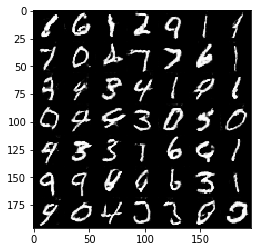

Epoch 2/2... Discriminator Loss: 1.1642... Generator Loss: 2.1258
Epoch 2/2... Discriminator Loss: 0.9215... Generator Loss: 1.6687
Epoch 2/2... Discriminator Loss: 1.1846... Generator Loss: 0.6981
Epoch 2/2... Discriminator Loss: 0.9300... Generator Loss: 1.1676
Epoch 2/2... Discriminator Loss: 1.3428... Generator Loss: 0.6172


In [12]:
batch_size = 32
z_dim = 128
learning_rate = 0.008
beta1 = 0.2

epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 9.0865... Generator Loss: 7.1090
Epoch 1/1... Discriminator Loss: 48.9301... Generator Loss: 47.2342
Epoch 1/1... Discriminator Loss: 4.2549... Generator Loss: 2.2667
Epoch 1/1... Discriminator Loss: 16.6997... Generator Loss: 7.9872
Epoch 1/1... Discriminator Loss: 4.0578... Generator Loss: 1.3100
Epoch 1/1... Discriminator Loss: 1.4811... Generator Loss: 1.5902
Epoch 1/1... Discriminator Loss: 3.9700... Generator Loss: 1.4100
Epoch 1/1... Discriminator Loss: 3.8979... Generator Loss: 1.0736
Epoch 1/1... Discriminator Loss: 4.5600... Generator Loss: 0.5129
Epoch 1/1... Discriminator Loss: 2.2511... Generator Loss: 2.8949


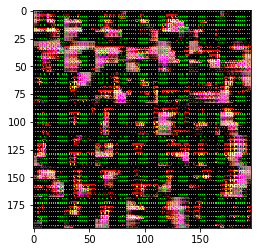

Epoch 1/1... Discriminator Loss: 2.7323... Generator Loss: 2.4630
Epoch 1/1... Discriminator Loss: 3.6796... Generator Loss: 0.4694
Epoch 1/1... Discriminator Loss: 2.8688... Generator Loss: 0.1824
Epoch 1/1... Discriminator Loss: 1.7666... Generator Loss: 0.8441
Epoch 1/1... Discriminator Loss: 3.4511... Generator Loss: 3.0574
Epoch 1/1... Discriminator Loss: 2.0742... Generator Loss: 1.8024
Epoch 1/1... Discriminator Loss: 1.6553... Generator Loss: 1.5310
Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 1.5170
Epoch 1/1... Discriminator Loss: 1.1015... Generator Loss: 1.1422
Epoch 1/1... Discriminator Loss: 3.5750... Generator Loss: 0.9204


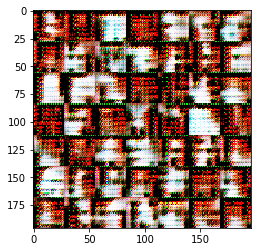

Epoch 1/1... Discriminator Loss: 2.8349... Generator Loss: 0.1596
Epoch 1/1... Discriminator Loss: 2.2245... Generator Loss: 0.5843
Epoch 1/1... Discriminator Loss: 1.3477... Generator Loss: 1.5761
Epoch 1/1... Discriminator Loss: 1.6099... Generator Loss: 1.6473
Epoch 1/1... Discriminator Loss: 2.1726... Generator Loss: 0.3764
Epoch 1/1... Discriminator Loss: 1.7115... Generator Loss: 0.3535
Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.6427
Epoch 1/1... Discriminator Loss: 1.4777... Generator Loss: 1.2451
Epoch 1/1... Discriminator Loss: 1.6014... Generator Loss: 1.4062
Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.8035


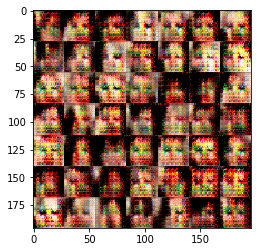

Epoch 1/1... Discriminator Loss: 1.3402... Generator Loss: 0.8572
Epoch 1/1... Discriminator Loss: 2.2406... Generator Loss: 0.1939
Epoch 1/1... Discriminator Loss: 1.5658... Generator Loss: 0.5121
Epoch 1/1... Discriminator Loss: 1.4519... Generator Loss: 0.5463
Epoch 1/1... Discriminator Loss: 1.4960... Generator Loss: 0.9768
Epoch 1/1... Discriminator Loss: 1.3772... Generator Loss: 0.6903
Epoch 1/1... Discriminator Loss: 1.3271... Generator Loss: 0.7645
Epoch 1/1... Discriminator Loss: 1.3608... Generator Loss: 0.7423
Epoch 1/1... Discriminator Loss: 1.4219... Generator Loss: 0.6216
Epoch 1/1... Discriminator Loss: 1.3720... Generator Loss: 0.8273


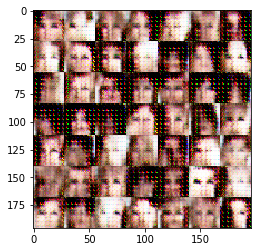

Epoch 1/1... Discriminator Loss: 1.4617... Generator Loss: 1.0079
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.7307
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.9388
Epoch 1/1... Discriminator Loss: 1.3913... Generator Loss: 0.9064
Epoch 1/1... Discriminator Loss: 1.4159... Generator Loss: 1.2981
Epoch 1/1... Discriminator Loss: 1.3672... Generator Loss: 0.8550
Epoch 1/1... Discriminator Loss: 1.3795... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.3645... Generator Loss: 0.7287
Epoch 1/1... Discriminator Loss: 1.4344... Generator Loss: 0.6790
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.8863


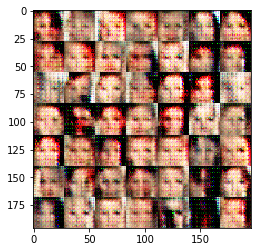

Epoch 1/1... Discriminator Loss: 1.3409... Generator Loss: 0.7631
Epoch 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.7656
Epoch 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.7496
Epoch 1/1... Discriminator Loss: 1.5127... Generator Loss: 0.4486
Epoch 1/1... Discriminator Loss: 1.3347... Generator Loss: 0.8363
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.7059
Epoch 1/1... Discriminator Loss: 1.4611... Generator Loss: 0.5668
Epoch 1/1... Discriminator Loss: 1.4093... Generator Loss: 1.0019
Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.8629
Epoch 1/1... Discriminator Loss: 1.3084... Generator Loss: 0.8095


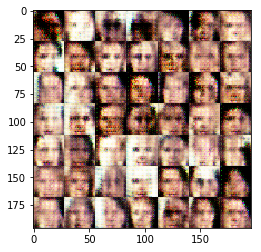

Epoch 1/1... Discriminator Loss: 1.3847... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.3441... Generator Loss: 0.7371
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.7543
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.8867
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.5209
Epoch 1/1... Discriminator Loss: 1.3482... Generator Loss: 0.8195
Epoch 1/1... Discriminator Loss: 1.4226... Generator Loss: 0.6725
Epoch 1/1... Discriminator Loss: 2.0211... Generator Loss: 0.2278
Epoch 1/1... Discriminator Loss: 1.2855... Generator Loss: 0.8562
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.7114


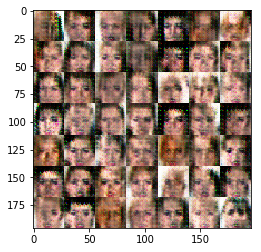

Epoch 1/1... Discriminator Loss: 1.3257... Generator Loss: 0.7820
Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.9342
Epoch 1/1... Discriminator Loss: 1.2434... Generator Loss: 0.9763
Epoch 1/1... Discriminator Loss: 1.3032... Generator Loss: 0.8278
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.5458
Epoch 1/1... Discriminator Loss: 1.3220... Generator Loss: 0.8144
Epoch 1/1... Discriminator Loss: 1.3994... Generator Loss: 0.7802
Epoch 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.5193
Epoch 1/1... Discriminator Loss: 1.4133... Generator Loss: 0.6642
Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 1.0373


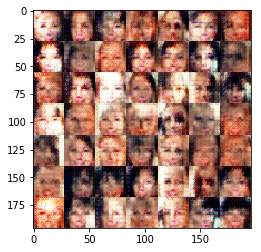

Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.7224
Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.8090
Epoch 1/1... Discriminator Loss: 1.4352... Generator Loss: 0.9201
Epoch 1/1... Discriminator Loss: 1.3936... Generator Loss: 0.6126
Epoch 1/1... Discriminator Loss: 1.3898... Generator Loss: 0.6767
Epoch 1/1... Discriminator Loss: 1.4941... Generator Loss: 0.9269
Epoch 1/1... Discriminator Loss: 1.3178... Generator Loss: 0.7879
Epoch 1/1... Discriminator Loss: 1.6007... Generator Loss: 1.4636
Epoch 1/1... Discriminator Loss: 1.3692... Generator Loss: 0.8255
Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.6312


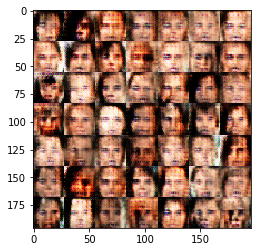

Epoch 1/1... Discriminator Loss: 1.4667... Generator Loss: 0.5540
Epoch 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.4974... Generator Loss: 0.4431
Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 0.7168
Epoch 1/1... Discriminator Loss: 1.3639... Generator Loss: 0.7368
Epoch 1/1... Discriminator Loss: 1.4052... Generator Loss: 1.0922
Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 0.9883
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.9528
Epoch 1/1... Discriminator Loss: 1.3759... Generator Loss: 0.6841
Epoch 1/1... Discriminator Loss: 1.3750... Generator Loss: 0.7511


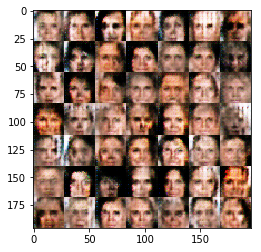

Epoch 1/1... Discriminator Loss: 1.4118... Generator Loss: 0.6176
Epoch 1/1... Discriminator Loss: 1.3779... Generator Loss: 0.8125
Epoch 1/1... Discriminator Loss: 1.3716... Generator Loss: 1.0127
Epoch 1/1... Discriminator Loss: 1.4997... Generator Loss: 0.5909
Epoch 1/1... Discriminator Loss: 1.3568... Generator Loss: 0.6677
Epoch 1/1... Discriminator Loss: 1.3755... Generator Loss: 0.6645
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.7850
Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.8368
Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.6695
Epoch 1/1... Discriminator Loss: 1.4207... Generator Loss: 0.5700


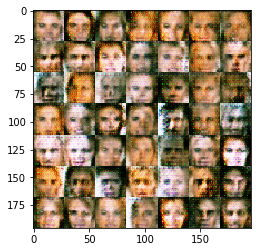

Epoch 1/1... Discriminator Loss: 1.3772... Generator Loss: 0.9462
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.7839
Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.6706
Epoch 1/1... Discriminator Loss: 1.4080... Generator Loss: 0.7020
Epoch 1/1... Discriminator Loss: 1.5031... Generator Loss: 1.1529
Epoch 1/1... Discriminator Loss: 1.3418... Generator Loss: 0.7963
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.7612
Epoch 1/1... Discriminator Loss: 1.3209... Generator Loss: 0.8293
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.8034
Epoch 1/1... Discriminator Loss: 1.4875... Generator Loss: 0.5330


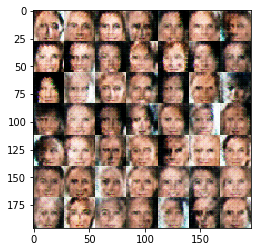

Epoch 1/1... Discriminator Loss: 1.4737... Generator Loss: 0.5077
Epoch 1/1... Discriminator Loss: 1.3814... Generator Loss: 0.8099
Epoch 1/1... Discriminator Loss: 1.4087... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 1.2855... Generator Loss: 0.6454
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.8150
Epoch 1/1... Discriminator Loss: 1.3758... Generator Loss: 0.7374
Epoch 1/1... Discriminator Loss: 1.4264... Generator Loss: 0.7968
Epoch 1/1... Discriminator Loss: 1.5055... Generator Loss: 1.0452
Epoch 1/1... Discriminator Loss: 1.3741... Generator Loss: 0.7695
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 0.6004


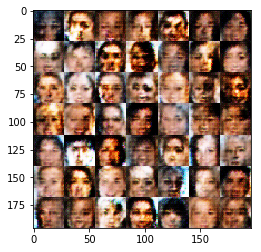

Epoch 1/1... Discriminator Loss: 1.4604... Generator Loss: 1.0388
Epoch 1/1... Discriminator Loss: 1.4192... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 0.7222
Epoch 1/1... Discriminator Loss: 1.7848... Generator Loss: 0.5729
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.8632
Epoch 1/1... Discriminator Loss: 1.3637... Generator Loss: 0.7297
Epoch 1/1... Discriminator Loss: 1.4227... Generator Loss: 0.8363
Epoch 1/1... Discriminator Loss: 1.3442... Generator Loss: 0.7777
Epoch 1/1... Discriminator Loss: 1.3653... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.6381


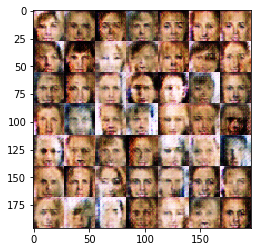

Epoch 1/1... Discriminator Loss: 1.5115... Generator Loss: 0.4778
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.9274
Epoch 1/1... Discriminator Loss: 1.4308... Generator Loss: 1.1712
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.6639
Epoch 1/1... Discriminator Loss: 1.4302... Generator Loss: 0.6077
Epoch 1/1... Discriminator Loss: 1.5125... Generator Loss: 0.6081
Epoch 1/1... Discriminator Loss: 1.4180... Generator Loss: 1.0893
Epoch 1/1... Discriminator Loss: 1.2865... Generator Loss: 0.9125
Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.8116
Epoch 1/1... Discriminator Loss: 1.3936... Generator Loss: 0.7001


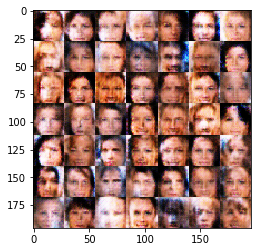

Epoch 1/1... Discriminator Loss: 1.3212... Generator Loss: 1.0495
Epoch 1/1... Discriminator Loss: 1.3504... Generator Loss: 0.7647
Epoch 1/1... Discriminator Loss: 1.3717... Generator Loss: 0.7995
Epoch 1/1... Discriminator Loss: 1.3758... Generator Loss: 0.9368
Epoch 1/1... Discriminator Loss: 1.3883... Generator Loss: 1.0640
Epoch 1/1... Discriminator Loss: 1.4583... Generator Loss: 0.5889
Epoch 1/1... Discriminator Loss: 1.4261... Generator Loss: 1.1826
Epoch 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.6228
Epoch 1/1... Discriminator Loss: 1.3797... Generator Loss: 0.8236
Epoch 1/1... Discriminator Loss: 1.5560... Generator Loss: 1.3447


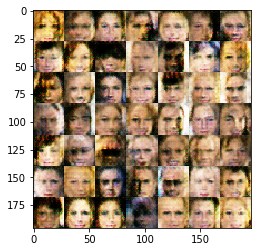

Epoch 1/1... Discriminator Loss: 1.3729... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.6162... Generator Loss: 0.4467
Epoch 1/1... Discriminator Loss: 1.3368... Generator Loss: 0.8768
Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.7253
Epoch 1/1... Discriminator Loss: 1.3833... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 1.1928
Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 0.6991
Epoch 1/1... Discriminator Loss: 1.2891... Generator Loss: 0.8008
Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.5998
Epoch 1/1... Discriminator Loss: 1.3597... Generator Loss: 1.0204


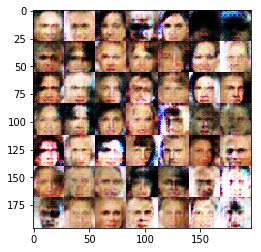

Epoch 1/1... Discriminator Loss: 1.3396... Generator Loss: 1.0059
Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.7894
Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.8207
Epoch 1/1... Discriminator Loss: 1.3786... Generator Loss: 0.8189
Epoch 1/1... Discriminator Loss: 1.4333... Generator Loss: 0.6616
Epoch 1/1... Discriminator Loss: 1.3574... Generator Loss: 1.0020
Epoch 1/1... Discriminator Loss: 1.3775... Generator Loss: 0.9673
Epoch 1/1... Discriminator Loss: 1.4828... Generator Loss: 0.4789
Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.9307
Epoch 1/1... Discriminator Loss: 1.5696... Generator Loss: 1.4203


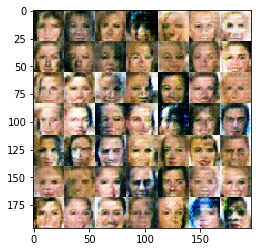

Epoch 1/1... Discriminator Loss: 1.3445... Generator Loss: 0.8565
Epoch 1/1... Discriminator Loss: 1.4132... Generator Loss: 0.8352
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.7415
Epoch 1/1... Discriminator Loss: 1.5181... Generator Loss: 0.4552
Epoch 1/1... Discriminator Loss: 1.3299... Generator Loss: 0.6823
Epoch 1/1... Discriminator Loss: 1.5310... Generator Loss: 0.5776
Epoch 1/1... Discriminator Loss: 1.3416... Generator Loss: 0.9292
Epoch 1/1... Discriminator Loss: 1.2747... Generator Loss: 0.9944
Epoch 1/1... Discriminator Loss: 1.4261... Generator Loss: 0.9204
Epoch 1/1... Discriminator Loss: 1.9250... Generator Loss: 0.2545


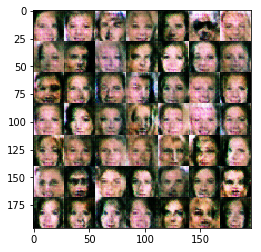

Epoch 1/1... Discriminator Loss: 1.3410... Generator Loss: 0.7555
Epoch 1/1... Discriminator Loss: 1.3679... Generator Loss: 1.0059
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.8102
Epoch 1/1... Discriminator Loss: 1.3539... Generator Loss: 0.9898
Epoch 1/1... Discriminator Loss: 1.5850... Generator Loss: 1.4815
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.6889
Epoch 1/1... Discriminator Loss: 1.4324... Generator Loss: 1.1147
Epoch 1/1... Discriminator Loss: 1.4840... Generator Loss: 0.4922
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.7936
Epoch 1/1... Discriminator Loss: 1.4964... Generator Loss: 1.2327


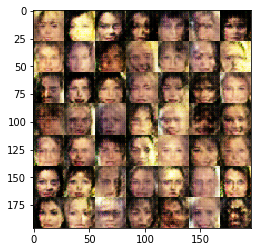

Epoch 1/1... Discriminator Loss: 1.3800... Generator Loss: 0.8121
Epoch 1/1... Discriminator Loss: 1.3903... Generator Loss: 1.0535
Epoch 1/1... Discriminator Loss: 1.4349... Generator Loss: 0.5467
Epoch 1/1... Discriminator Loss: 1.3919... Generator Loss: 1.1604
Epoch 1/1... Discriminator Loss: 1.3771... Generator Loss: 0.6203
Epoch 1/1... Discriminator Loss: 1.4249... Generator Loss: 0.5872
Epoch 1/1... Discriminator Loss: 1.7304... Generator Loss: 0.3229
Epoch 1/1... Discriminator Loss: 1.7647... Generator Loss: 0.3322
Epoch 1/1... Discriminator Loss: 1.3708... Generator Loss: 0.7174
Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.7243


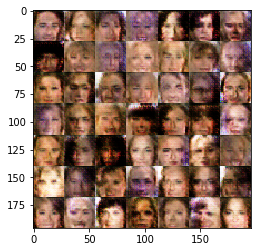

Epoch 1/1... Discriminator Loss: 1.3168... Generator Loss: 0.9651
Epoch 1/1... Discriminator Loss: 1.4470... Generator Loss: 0.6862
Epoch 1/1... Discriminator Loss: 1.3429... Generator Loss: 0.7089
Epoch 1/1... Discriminator Loss: 1.3155... Generator Loss: 0.8802
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.9879
Epoch 1/1... Discriminator Loss: 1.3310... Generator Loss: 0.8851
Epoch 1/1... Discriminator Loss: 1.4147... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.7481
Epoch 1/1... Discriminator Loss: 1.2375... Generator Loss: 0.9230
Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.9939


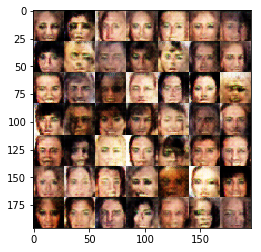

Epoch 1/1... Discriminator Loss: 1.2673... Generator Loss: 0.9167
Epoch 1/1... Discriminator Loss: 1.3390... Generator Loss: 0.6396
Epoch 1/1... Discriminator Loss: 1.3846... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 1.5585... Generator Loss: 0.4315
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.9328
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 1.1416
Epoch 1/1... Discriminator Loss: 1.2718... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 1.3025... Generator Loss: 0.6743
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 0.9667
Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 0.6927


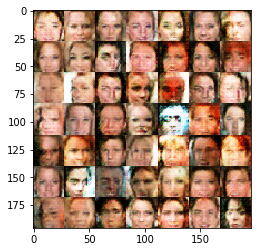

Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.9233
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 1.0288
Epoch 1/1... Discriminator Loss: 1.4874... Generator Loss: 1.2552
Epoch 1/1... Discriminator Loss: 1.4282... Generator Loss: 1.2170
Epoch 1/1... Discriminator Loss: 1.3333... Generator Loss: 1.0672
Epoch 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.8984
Epoch 1/1... Discriminator Loss: 1.4080... Generator Loss: 0.6302
Epoch 1/1... Discriminator Loss: 1.3301... Generator Loss: 0.8076
Epoch 1/1... Discriminator Loss: 1.3519... Generator Loss: 0.6035
Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.6334


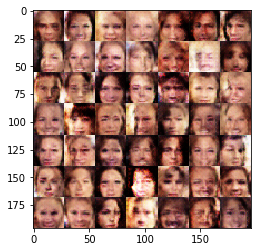

Epoch 1/1... Discriminator Loss: 1.3578... Generator Loss: 1.2136
Epoch 1/1... Discriminator Loss: 1.3597... Generator Loss: 0.8195
Epoch 1/1... Discriminator Loss: 1.3983... Generator Loss: 1.1230
Epoch 1/1... Discriminator Loss: 2.7198... Generator Loss: 0.0991
Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.4149... Generator Loss: 0.5101
Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 1.1131
Epoch 1/1... Discriminator Loss: 1.4949... Generator Loss: 1.2889
Epoch 1/1... Discriminator Loss: 1.2560... Generator Loss: 0.8655
Epoch 1/1... Discriminator Loss: 1.3655... Generator Loss: 0.6508


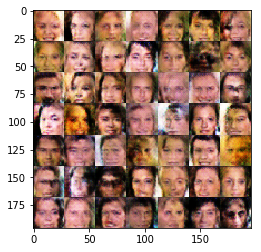

Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.8175
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 0.8289
Epoch 1/1... Discriminator Loss: 1.4531... Generator Loss: 1.3794
Epoch 1/1... Discriminator Loss: 1.2562... Generator Loss: 0.8234
Epoch 1/1... Discriminator Loss: 1.4903... Generator Loss: 0.4492
Epoch 1/1... Discriminator Loss: 1.2820... Generator Loss: 0.9730
Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.8704
Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 0.7802
Epoch 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.8642


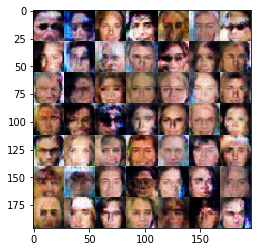

Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.7956
Epoch 1/1... Discriminator Loss: 1.3206... Generator Loss: 0.7117
Epoch 1/1... Discriminator Loss: 1.3065... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.4512... Generator Loss: 0.5265
Epoch 1/1... Discriminator Loss: 1.3661... Generator Loss: 0.5440
Epoch 1/1... Discriminator Loss: 1.3209... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.4785... Generator Loss: 0.4951
Epoch 1/1... Discriminator Loss: 1.2269... Generator Loss: 0.9988
Epoch 1/1... Discriminator Loss: 1.4596... Generator Loss: 0.5269
Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 1.0626


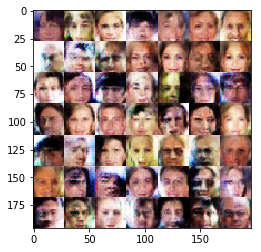

Epoch 1/1... Discriminator Loss: 1.2995... Generator Loss: 0.6789
Epoch 1/1... Discriminator Loss: 1.6358... Generator Loss: 1.6436
Epoch 1/1... Discriminator Loss: 1.3135... Generator Loss: 0.8232
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 1.0731
Epoch 1/1... Discriminator Loss: 1.3155... Generator Loss: 0.8743
Epoch 1/1... Discriminator Loss: 1.3714... Generator Loss: 0.7230
Epoch 1/1... Discriminator Loss: 1.3057... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.4927... Generator Loss: 0.4448
Epoch 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.8888
Epoch 1/1... Discriminator Loss: 1.3003... Generator Loss: 0.8449


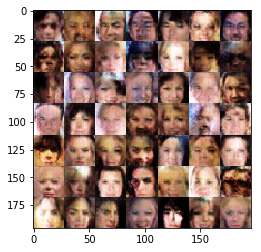

Epoch 1/1... Discriminator Loss: 1.4626... Generator Loss: 0.4904
Epoch 1/1... Discriminator Loss: 1.6665... Generator Loss: 0.3656
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 1.3821... Generator Loss: 0.7283
Epoch 1/1... Discriminator Loss: 1.3498... Generator Loss: 1.1375
Epoch 1/1... Discriminator Loss: 1.3405... Generator Loss: 1.1118
Epoch 1/1... Discriminator Loss: 1.2010... Generator Loss: 0.9006
Epoch 1/1... Discriminator Loss: 1.4086... Generator Loss: 0.5710
Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 1.0205
Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 0.8990


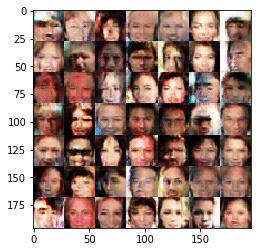

Epoch 1/1... Discriminator Loss: 1.3099... Generator Loss: 0.6463
Epoch 1/1... Discriminator Loss: 1.2806... Generator Loss: 1.2951
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 1.0116
Epoch 1/1... Discriminator Loss: 1.3783... Generator Loss: 0.5515
Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 0.7571
Epoch 1/1... Discriminator Loss: 1.4048... Generator Loss: 0.5060
Epoch 1/1... Discriminator Loss: 1.3456... Generator Loss: 1.2756
Epoch 1/1... Discriminator Loss: 1.2814... Generator Loss: 1.1911
Epoch 1/1... Discriminator Loss: 1.4010... Generator Loss: 1.5926
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 1.0985


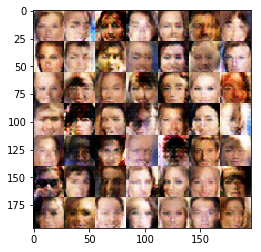

Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.5417
Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 1.3019... Generator Loss: 1.0549
Epoch 1/1... Discriminator Loss: 1.2292... Generator Loss: 0.8423
Epoch 1/1... Discriminator Loss: 1.4350... Generator Loss: 0.4770
Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.5730
Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 0.6052
Epoch 1/1... Discriminator Loss: 1.3759... Generator Loss: 1.0244
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 1.0483
Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 1.0048


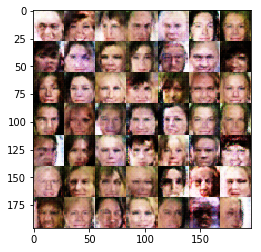

Epoch 1/1... Discriminator Loss: 1.3250... Generator Loss: 1.0615
Epoch 1/1... Discriminator Loss: 1.7153... Generator Loss: 0.3341
Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.9993
Epoch 1/1... Discriminator Loss: 1.6845... Generator Loss: 0.3520
Epoch 1/1... Discriminator Loss: 1.2915... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.3102... Generator Loss: 0.9312
Epoch 1/1... Discriminator Loss: 1.3620... Generator Loss: 0.8392
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.6968
Epoch 1/1... Discriminator Loss: 1.2654... Generator Loss: 0.7271
Epoch 1/1... Discriminator Loss: 1.2733... Generator Loss: 0.9680


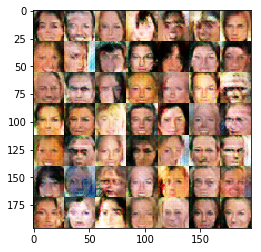

Epoch 1/1... Discriminator Loss: 1.1861... Generator Loss: 0.9177
Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 1.3785
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 1.2171
Epoch 1/1... Discriminator Loss: 1.6149... Generator Loss: 0.4037
Epoch 1/1... Discriminator Loss: 1.3355... Generator Loss: 0.8491
Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 1.1099
Epoch 1/1... Discriminator Loss: 1.3581... Generator Loss: 0.6576
Epoch 1/1... Discriminator Loss: 1.2651... Generator Loss: 1.1554
Epoch 1/1... Discriminator Loss: 1.2783... Generator Loss: 0.8256
Epoch 1/1... Discriminator Loss: 1.2672... Generator Loss: 0.7881


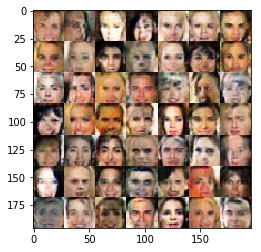

Epoch 1/1... Discriminator Loss: 1.2541... Generator Loss: 0.7573
Epoch 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.6997
Epoch 1/1... Discriminator Loss: 1.5327... Generator Loss: 0.4449
Epoch 1/1... Discriminator Loss: 1.3071... Generator Loss: 1.0425
Epoch 1/1... Discriminator Loss: 1.2861... Generator Loss: 0.7541
Epoch 1/1... Discriminator Loss: 1.3142... Generator Loss: 0.8051
Epoch 1/1... Discriminator Loss: 1.4121... Generator Loss: 0.5431
Epoch 1/1... Discriminator Loss: 1.5270... Generator Loss: 0.4807
Epoch 1/1... Discriminator Loss: 1.4709... Generator Loss: 1.1867
Epoch 1/1... Discriminator Loss: 1.4364... Generator Loss: 0.4992


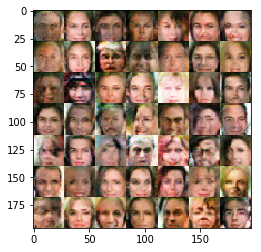

Epoch 1/1... Discriminator Loss: 1.5456... Generator Loss: 0.4127
Epoch 1/1... Discriminator Loss: 1.2085... Generator Loss: 0.8448
Epoch 1/1... Discriminator Loss: 1.5322... Generator Loss: 0.4518
Epoch 1/1... Discriminator Loss: 1.3021... Generator Loss: 0.8075
Epoch 1/1... Discriminator Loss: 1.3703... Generator Loss: 0.5201
Epoch 1/1... Discriminator Loss: 1.5124... Generator Loss: 0.4759
Epoch 1/1... Discriminator Loss: 1.4740... Generator Loss: 1.4215
Epoch 1/1... Discriminator Loss: 1.2898... Generator Loss: 1.2216
Epoch 1/1... Discriminator Loss: 1.3662... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 1.3104... Generator Loss: 0.8551


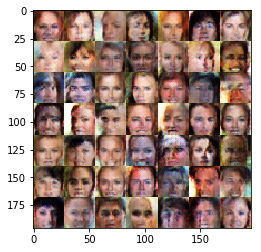

Epoch 1/1... Discriminator Loss: 1.4243... Generator Loss: 0.5759
Epoch 1/1... Discriminator Loss: 1.2640... Generator Loss: 0.8927
Epoch 1/1... Discriminator Loss: 1.3690... Generator Loss: 0.6121
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 0.5055
Epoch 1/1... Discriminator Loss: 1.2438... Generator Loss: 0.7965
Epoch 1/1... Discriminator Loss: 1.3682... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.2262... Generator Loss: 0.8320
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 1.1734
Epoch 1/1... Discriminator Loss: 1.2664... Generator Loss: 0.8653
Epoch 1/1... Discriminator Loss: 1.3266... Generator Loss: 0.5762


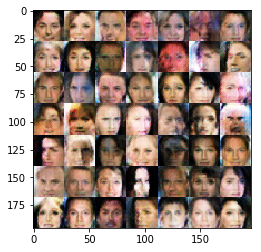

Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 0.9598
Epoch 1/1... Discriminator Loss: 1.2525... Generator Loss: 0.7376
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.7131
Epoch 1/1... Discriminator Loss: 1.4087... Generator Loss: 0.8840
Epoch 1/1... Discriminator Loss: 1.3610... Generator Loss: 1.3314
Epoch 1/1... Discriminator Loss: 1.2748... Generator Loss: 0.8375
Epoch 1/1... Discriminator Loss: 1.2480... Generator Loss: 1.0750
Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 0.7244
Epoch 1/1... Discriminator Loss: 1.3935... Generator Loss: 0.5801
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 1.3118


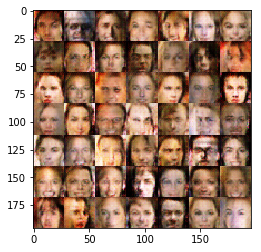

Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.5530
Epoch 1/1... Discriminator Loss: 1.3226... Generator Loss: 1.1114
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 1.1116
Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 1.0636
Epoch 1/1... Discriminator Loss: 1.4441... Generator Loss: 0.4976
Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 0.5511
Epoch 1/1... Discriminator Loss: 1.6815... Generator Loss: 0.3467
Epoch 1/1... Discriminator Loss: 1.2354... Generator Loss: 0.7980
Epoch 1/1... Discriminator Loss: 1.2688... Generator Loss: 0.8628
Epoch 1/1... Discriminator Loss: 1.5355... Generator Loss: 0.4438


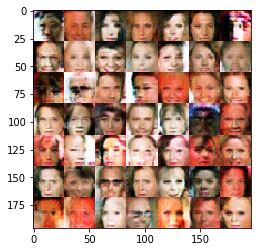

Epoch 1/1... Discriminator Loss: 1.3190... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.2458... Generator Loss: 0.8060
Epoch 1/1... Discriminator Loss: 1.5116... Generator Loss: 0.4643
Epoch 1/1... Discriminator Loss: 1.3336... Generator Loss: 1.0593
Epoch 1/1... Discriminator Loss: 1.4944... Generator Loss: 1.3898
Epoch 1/1... Discriminator Loss: 1.3997... Generator Loss: 1.1090
Epoch 1/1... Discriminator Loss: 1.2342... Generator Loss: 0.8548
Epoch 1/1... Discriminator Loss: 1.4860... Generator Loss: 0.4453
Epoch 1/1... Discriminator Loss: 1.5418... Generator Loss: 0.4522
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.6715


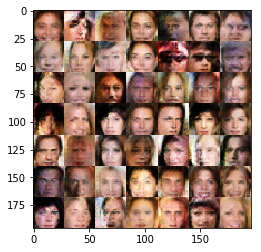

Epoch 1/1... Discriminator Loss: 1.3476... Generator Loss: 1.0372
Epoch 1/1... Discriminator Loss: 1.3834... Generator Loss: 1.3820
Epoch 1/1... Discriminator Loss: 1.2963... Generator Loss: 0.7387
Epoch 1/1... Discriminator Loss: 1.3328... Generator Loss: 0.8102
Epoch 1/1... Discriminator Loss: 1.3449... Generator Loss: 0.8161
Epoch 1/1... Discriminator Loss: 1.2918... Generator Loss: 0.9328
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 1.2607
Epoch 1/1... Discriminator Loss: 1.3447... Generator Loss: 0.5785
Epoch 1/1... Discriminator Loss: 1.5008... Generator Loss: 1.6254
Epoch 1/1... Discriminator Loss: 1.3140... Generator Loss: 0.9059


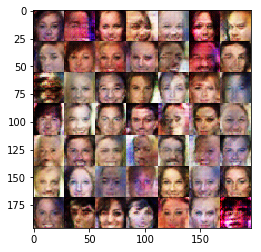

Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 1.2683
Epoch 1/1... Discriminator Loss: 1.3485... Generator Loss: 1.3584
Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 1.0116
Epoch 1/1... Discriminator Loss: 1.6912... Generator Loss: 0.3369
Epoch 1/1... Discriminator Loss: 1.2537... Generator Loss: 0.7845
Epoch 1/1... Discriminator Loss: 1.2819... Generator Loss: 1.1091
Epoch 1/1... Discriminator Loss: 1.4362... Generator Loss: 1.2195
Epoch 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.6928
Epoch 1/1... Discriminator Loss: 1.3601... Generator Loss: 0.8106
Epoch 1/1... Discriminator Loss: 1.2948... Generator Loss: 0.8808


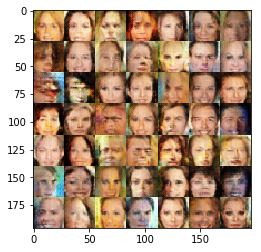

Epoch 1/1... Discriminator Loss: 1.7454... Generator Loss: 0.3125
Epoch 1/1... Discriminator Loss: 1.3322... Generator Loss: 0.6583
Epoch 1/1... Discriminator Loss: 1.2647... Generator Loss: 1.0541
Epoch 1/1... Discriminator Loss: 1.2619... Generator Loss: 1.0494
Epoch 1/1... Discriminator Loss: 1.2247... Generator Loss: 0.9952
Epoch 1/1... Discriminator Loss: 1.3191... Generator Loss: 0.6727
Epoch 1/1... Discriminator Loss: 1.3687... Generator Loss: 0.5929
Epoch 1/1... Discriminator Loss: 1.3220... Generator Loss: 0.6682
Epoch 1/1... Discriminator Loss: 1.5013... Generator Loss: 0.4738
Epoch 1/1... Discriminator Loss: 1.3466... Generator Loss: 0.5821


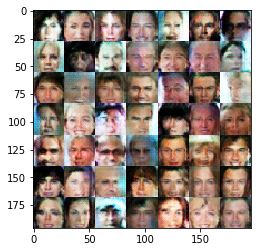

Epoch 1/1... Discriminator Loss: 1.3375... Generator Loss: 0.6713
Epoch 1/1... Discriminator Loss: 1.3078... Generator Loss: 0.8020
Epoch 1/1... Discriminator Loss: 1.2447... Generator Loss: 0.7489
Epoch 1/1... Discriminator Loss: 1.3250... Generator Loss: 0.8081
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.6019
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.4954
Epoch 1/1... Discriminator Loss: 1.1945... Generator Loss: 0.8498
Epoch 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.5541
Epoch 1/1... Discriminator Loss: 1.2256... Generator Loss: 0.9319
Epoch 1/1... Discriminator Loss: 1.3024... Generator Loss: 0.6846


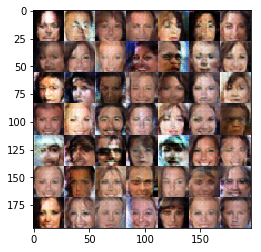

Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.8659
Epoch 1/1... Discriminator Loss: 1.2195... Generator Loss: 0.8241
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.6814
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.8646
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.6084
Epoch 1/1... Discriminator Loss: 1.2893... Generator Loss: 0.9880
Epoch 1/1... Discriminator Loss: 1.2138... Generator Loss: 1.1168
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.5959
Epoch 1/1... Discriminator Loss: 1.3582... Generator Loss: 0.5329
Epoch 1/1... Discriminator Loss: 1.2895... Generator Loss: 0.8777


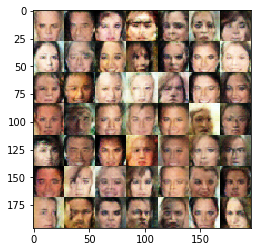

Epoch 1/1... Discriminator Loss: 1.4228... Generator Loss: 0.5737
Epoch 1/1... Discriminator Loss: 1.2990... Generator Loss: 1.2508
Epoch 1/1... Discriminator Loss: 1.3594... Generator Loss: 0.9189
Epoch 1/1... Discriminator Loss: 1.4281... Generator Loss: 1.2775
Epoch 1/1... Discriminator Loss: 1.3209... Generator Loss: 0.6139
Epoch 1/1... Discriminator Loss: 1.3141... Generator Loss: 0.7009
Epoch 1/1... Discriminator Loss: 1.1764... Generator Loss: 1.1593
Epoch 1/1... Discriminator Loss: 1.3707... Generator Loss: 0.6140
Epoch 1/1... Discriminator Loss: 1.3337... Generator Loss: 0.7241
Epoch 1/1... Discriminator Loss: 1.4074... Generator Loss: 0.5824


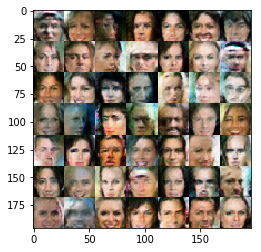

Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.8112
Epoch 1/1... Discriminator Loss: 1.2912... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 1.3336... Generator Loss: 0.7568
Epoch 1/1... Discriminator Loss: 1.2995... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.3073... Generator Loss: 1.2055
Epoch 1/1... Discriminator Loss: 1.3579... Generator Loss: 0.5418
Epoch 1/1... Discriminator Loss: 1.3620... Generator Loss: 0.7136
Epoch 1/1... Discriminator Loss: 1.4025... Generator Loss: 1.1655
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 1.3808
Epoch 1/1... Discriminator Loss: 1.2676... Generator Loss: 0.6956


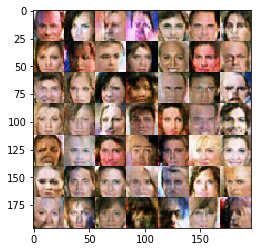

Epoch 1/1... Discriminator Loss: 1.2303... Generator Loss: 0.7769
Epoch 1/1... Discriminator Loss: 1.2894... Generator Loss: 0.8162
Epoch 1/1... Discriminator Loss: 1.6642... Generator Loss: 1.6880
Epoch 1/1... Discriminator Loss: 1.4471... Generator Loss: 1.3743
Epoch 1/1... Discriminator Loss: 1.2584... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.4011... Generator Loss: 0.5339
Epoch 1/1... Discriminator Loss: 1.4358... Generator Loss: 1.2670
Epoch 1/1... Discriminator Loss: 1.3243... Generator Loss: 0.5492
Epoch 1/1... Discriminator Loss: 1.3030... Generator Loss: 0.7567
Epoch 1/1... Discriminator Loss: 1.5062... Generator Loss: 0.5378


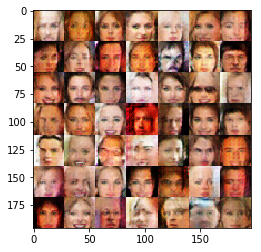

Epoch 1/1... Discriminator Loss: 1.6394... Generator Loss: 0.3449
Epoch 1/1... Discriminator Loss: 1.3642... Generator Loss: 1.1863
Epoch 1/1... Discriminator Loss: 1.2546... Generator Loss: 0.7478
Epoch 1/1... Discriminator Loss: 1.3858... Generator Loss: 1.4848
Epoch 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.8857
Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.8902
Epoch 1/1... Discriminator Loss: 1.5790... Generator Loss: 1.3502
Epoch 1/1... Discriminator Loss: 1.4376... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.3109... Generator Loss: 0.7995
Epoch 1/1... Discriminator Loss: 1.5677... Generator Loss: 0.3922


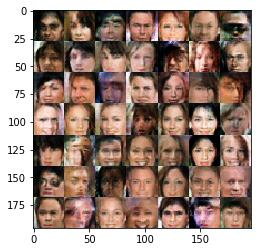

Epoch 1/1... Discriminator Loss: 1.3653... Generator Loss: 1.1002
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 1.2158
Epoch 1/1... Discriminator Loss: 1.3027... Generator Loss: 1.0257
Epoch 1/1... Discriminator Loss: 1.3792... Generator Loss: 0.5974
Epoch 1/1... Discriminator Loss: 1.2091... Generator Loss: 0.7780
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 1.0166
Epoch 1/1... Discriminator Loss: 1.5000... Generator Loss: 0.4399
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.4626... Generator Loss: 0.4869
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.6047


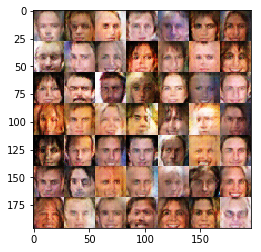

Epoch 1/1... Discriminator Loss: 1.2865... Generator Loss: 1.0442
Epoch 1/1... Discriminator Loss: 1.4886... Generator Loss: 0.4227
Epoch 1/1... Discriminator Loss: 1.3288... Generator Loss: 1.2185
Epoch 1/1... Discriminator Loss: 1.2834... Generator Loss: 0.8679
Epoch 1/1... Discriminator Loss: 1.3024... Generator Loss: 1.0478
Epoch 1/1... Discriminator Loss: 1.4630... Generator Loss: 0.4657
Epoch 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.9847
Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 1.3619... Generator Loss: 0.6220
Epoch 1/1... Discriminator Loss: 1.2208... Generator Loss: 0.7913


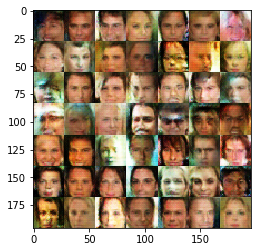

Epoch 1/1... Discriminator Loss: 1.3176... Generator Loss: 0.9762
Epoch 1/1... Discriminator Loss: 1.4431... Generator Loss: 1.4702
Epoch 1/1... Discriminator Loss: 1.4183... Generator Loss: 1.3353
Epoch 1/1... Discriminator Loss: 1.3201... Generator Loss: 1.0383
Epoch 1/1... Discriminator Loss: 1.3006... Generator Loss: 0.7029
Epoch 1/1... Discriminator Loss: 1.2219... Generator Loss: 1.1749
Epoch 1/1... Discriminator Loss: 1.2522... Generator Loss: 0.8443
Epoch 1/1... Discriminator Loss: 1.2816... Generator Loss: 0.8475
Epoch 1/1... Discriminator Loss: 1.2874... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 1.5156... Generator Loss: 0.4334


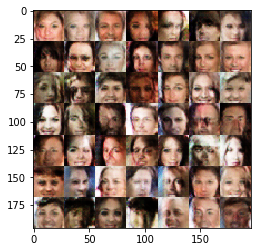

Epoch 1/1... Discriminator Loss: 1.2816... Generator Loss: 0.8793
Epoch 1/1... Discriminator Loss: 1.4387... Generator Loss: 0.6305
Epoch 1/1... Discriminator Loss: 1.3456... Generator Loss: 0.6566
Epoch 1/1... Discriminator Loss: 1.3686... Generator Loss: 0.5438
Epoch 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.5760
Epoch 1/1... Discriminator Loss: 1.3932... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 0.5276
Epoch 1/1... Discriminator Loss: 1.3491... Generator Loss: 0.7081
Epoch 1/1... Discriminator Loss: 1.4604... Generator Loss: 0.5167
Epoch 1/1... Discriminator Loss: 1.3809... Generator Loss: 0.6435


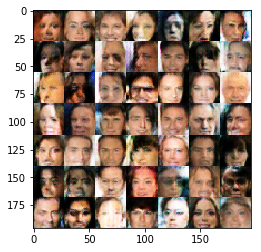

Epoch 1/1... Discriminator Loss: 1.3601... Generator Loss: 0.6623
Epoch 1/1... Discriminator Loss: 1.3606... Generator Loss: 1.1571
Epoch 1/1... Discriminator Loss: 1.4374... Generator Loss: 0.5598
Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 1.1177
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.7675
Epoch 1/1... Discriminator Loss: 1.3553... Generator Loss: 1.1191
Epoch 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.8142
Epoch 1/1... Discriminator Loss: 1.2962... Generator Loss: 1.0931
Epoch 1/1... Discriminator Loss: 1.7551... Generator Loss: 0.3274
Epoch 1/1... Discriminator Loss: 1.2548... Generator Loss: 1.0606


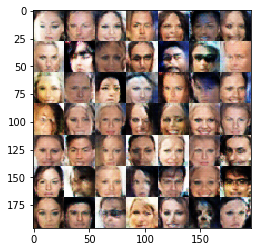

Epoch 1/1... Discriminator Loss: 1.4469... Generator Loss: 1.3702
Epoch 1/1... Discriminator Loss: 1.3829... Generator Loss: 1.0864
Epoch 1/1... Discriminator Loss: 1.2876... Generator Loss: 1.0341
Epoch 1/1... Discriminator Loss: 1.3476... Generator Loss: 1.1960
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.6579
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.5455
Epoch 1/1... Discriminator Loss: 1.5428... Generator Loss: 0.4429
Epoch 1/1... Discriminator Loss: 1.4006... Generator Loss: 0.5812
Epoch 1/1... Discriminator Loss: 1.6286... Generator Loss: 0.3487
Epoch 1/1... Discriminator Loss: 1.4007... Generator Loss: 0.5176


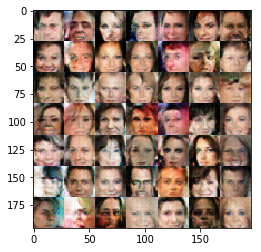

Epoch 1/1... Discriminator Loss: 1.4132... Generator Loss: 1.4117
Epoch 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.8732
Epoch 1/1... Discriminator Loss: 1.7487... Generator Loss: 0.3263
Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.6738... Generator Loss: 0.3732
Epoch 1/1... Discriminator Loss: 1.5043... Generator Loss: 0.4141
Epoch 1/1... Discriminator Loss: 1.3643... Generator Loss: 0.6214
Epoch 1/1... Discriminator Loss: 1.3452... Generator Loss: 0.6119
Epoch 1/1... Discriminator Loss: 1.3053... Generator Loss: 1.1275
Epoch 1/1... Discriminator Loss: 1.2202... Generator Loss: 1.0575


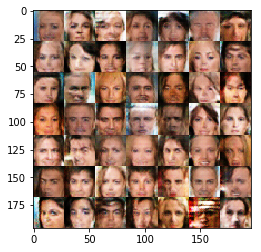

Epoch 1/1... Discriminator Loss: 1.2908... Generator Loss: 1.0925
Epoch 1/1... Discriminator Loss: 1.5583... Generator Loss: 0.4393
Epoch 1/1... Discriminator Loss: 1.4545... Generator Loss: 0.4757
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.5365
Epoch 1/1... Discriminator Loss: 1.2617... Generator Loss: 1.0203
Epoch 1/1... Discriminator Loss: 1.2922... Generator Loss: 1.1259
Epoch 1/1... Discriminator Loss: 1.2568... Generator Loss: 1.1806
Epoch 1/1... Discriminator Loss: 1.3134... Generator Loss: 0.6552
Epoch 1/1... Discriminator Loss: 1.3995... Generator Loss: 0.6602
Epoch 1/1... Discriminator Loss: 1.3283... Generator Loss: 0.5986


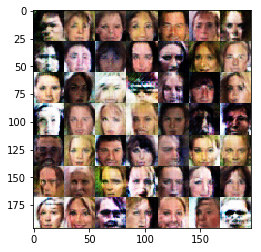

Epoch 1/1... Discriminator Loss: 1.5810... Generator Loss: 0.4312
Epoch 1/1... Discriminator Loss: 1.4116... Generator Loss: 0.5533
Epoch 1/1... Discriminator Loss: 1.2107... Generator Loss: 1.0110
Epoch 1/1... Discriminator Loss: 1.2190... Generator Loss: 0.9374
Epoch 1/1... Discriminator Loss: 1.4607... Generator Loss: 0.5144
Epoch 1/1... Discriminator Loss: 1.3567... Generator Loss: 0.6059
Epoch 1/1... Discriminator Loss: 1.3307... Generator Loss: 0.5902
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.9184
Epoch 1/1... Discriminator Loss: 1.4126... Generator Loss: 0.5679
Epoch 1/1... Discriminator Loss: 1.2432... Generator Loss: 0.7849


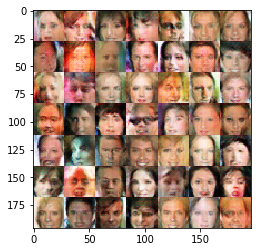

Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.7035
Epoch 1/1... Discriminator Loss: 1.4817... Generator Loss: 0.4692
Epoch 1/1... Discriminator Loss: 1.3023... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 1.3689... Generator Loss: 0.6170
Epoch 1/1... Discriminator Loss: 1.2132... Generator Loss: 0.8953
Epoch 1/1... Discriminator Loss: 1.4026... Generator Loss: 1.3292
Epoch 1/1... Discriminator Loss: 1.4069... Generator Loss: 1.2595
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 1.1234
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.9776
Epoch 1/1... Discriminator Loss: 1.2417... Generator Loss: 0.8432


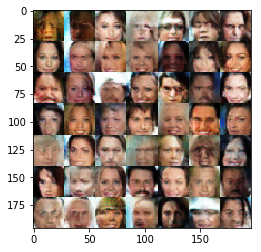

Epoch 1/1... Discriminator Loss: 1.1520... Generator Loss: 0.8433
Epoch 1/1... Discriminator Loss: 1.1854... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3126... Generator Loss: 1.2696
Epoch 1/1... Discriminator Loss: 1.6306... Generator Loss: 0.4366
Epoch 1/1... Discriminator Loss: 1.3069... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 1.2267
Epoch 1/1... Discriminator Loss: 1.3976... Generator Loss: 0.5995
Epoch 1/1... Discriminator Loss: 1.3406... Generator Loss: 0.7173
Epoch 1/1... Discriminator Loss: 1.3642... Generator Loss: 1.0212
Epoch 1/1... Discriminator Loss: 1.2277... Generator Loss: 1.2318


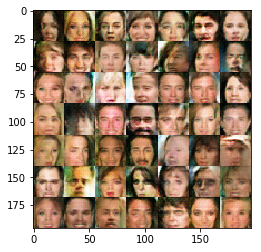

Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.8242
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.6161
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.5150
Epoch 1/1... Discriminator Loss: 1.4005... Generator Loss: 1.2661
Epoch 1/1... Discriminator Loss: 1.2891... Generator Loss: 0.6055
Epoch 1/1... Discriminator Loss: 1.3228... Generator Loss: 0.6200
Epoch 1/1... Discriminator Loss: 1.3151... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.4600... Generator Loss: 0.6676
Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 1.2384
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.9584


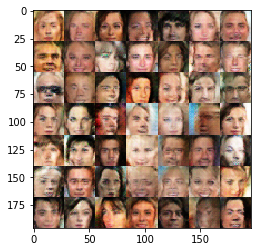

Epoch 1/1... Discriminator Loss: 1.5198... Generator Loss: 0.4218
Epoch 1/1... Discriminator Loss: 1.6520... Generator Loss: 0.3887
Epoch 1/1... Discriminator Loss: 1.5828... Generator Loss: 0.3855
Epoch 1/1... Discriminator Loss: 1.3226... Generator Loss: 0.6959
Epoch 1/1... Discriminator Loss: 1.3232... Generator Loss: 0.6348
Epoch 1/1... Discriminator Loss: 1.3453... Generator Loss: 0.6236
Epoch 1/1... Discriminator Loss: 1.4930... Generator Loss: 1.2773
Epoch 1/1... Discriminator Loss: 1.7378... Generator Loss: 1.7490
Epoch 1/1... Discriminator Loss: 1.4829... Generator Loss: 0.4703
Epoch 1/1... Discriminator Loss: 1.3289... Generator Loss: 0.6012


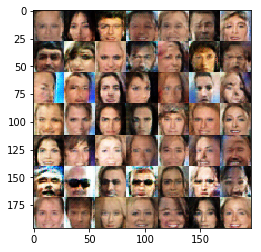

Epoch 1/1... Discriminator Loss: 1.2594... Generator Loss: 0.8701
Epoch 1/1... Discriminator Loss: 1.2627... Generator Loss: 1.2203
Epoch 1/1... Discriminator Loss: 1.4473... Generator Loss: 1.4387
Epoch 1/1... Discriminator Loss: 1.2882... Generator Loss: 0.6568
Epoch 1/1... Discriminator Loss: 1.4728... Generator Loss: 0.4637
Epoch 1/1... Discriminator Loss: 1.3195... Generator Loss: 0.7269
Epoch 1/1... Discriminator Loss: 1.3846... Generator Loss: 1.2842
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.5249
Epoch 1/1... Discriminator Loss: 1.4699... Generator Loss: 0.4666
Epoch 1/1... Discriminator Loss: 1.2985... Generator Loss: 0.8251


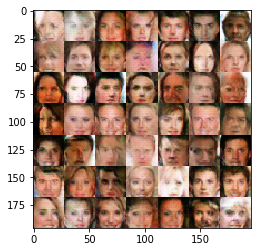

Epoch 1/1... Discriminator Loss: 1.1648... Generator Loss: 0.8248
Epoch 1/1... Discriminator Loss: 1.3247... Generator Loss: 0.8101
Epoch 1/1... Discriminator Loss: 1.2929... Generator Loss: 1.0524
Epoch 1/1... Discriminator Loss: 1.2990... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.4011... Generator Loss: 1.2897
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.6108
Epoch 1/1... Discriminator Loss: 1.3451... Generator Loss: 1.2754
Epoch 1/1... Discriminator Loss: 1.2153... Generator Loss: 0.9901
Epoch 1/1... Discriminator Loss: 1.2993... Generator Loss: 1.1344
Epoch 1/1... Discriminator Loss: 1.8640... Generator Loss: 0.2802


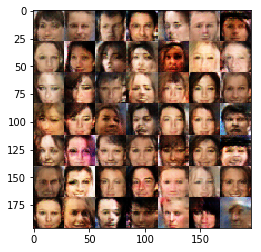

Epoch 1/1... Discriminator Loss: 1.6419... Generator Loss: 0.4476
Epoch 1/1... Discriminator Loss: 1.1988... Generator Loss: 0.9356
Epoch 1/1... Discriminator Loss: 1.3304... Generator Loss: 0.7666


In [13]:
batch_size = 32
z_dim = 128
learning_rate = 0.008
beta1 = 0.2

epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)